In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import cv2
import random
from tqdm import tqdm
from fastai.vision.all import load_learner
from mtrain.utils import mkdir, show, draw_grid
from mtrain.smallnet.unet.predict import overlay_mask_on_img
import torch

In [3]:
DS = Path("../../datasets")
BASE = DS / "test-samples"
NEG_MASKING_DIR = mkdir(BASE / "neg-masking")
NEG_MASK_WORK_DIR = mkdir(BASE / "neg-masking" / "V1")

In [4]:
class DiskImage:
    @classmethod
    def save(cls, arr: np.ndarray, path: Path | str):
        Image.fromarray(arr, "RGB").save(path)
    
    @classmethod
    def load(cls, path: Path | str):
        return np.array(Image.open(path).convert("RGB"))

class DiskMask:
    @classmethod
    def save(cls, arr: np.ndarray, path: Path | str):
        Image.fromarray(arr, "L").save(path)
    
    @classmethod
    def load(cls, path: Path | str):
        return np.array(Image.open(path).convert("L"))

    @classmethod
    def load_as_bool(cls, path: Path | str):
        return np.array(Image.open(path).convert("L")).astype(bool)

# Generate input masks and images

In [5]:
IMAGE_DIR = BASE / "positive-samples"
images = list(IMAGE_DIR.glob("*.jpg"))
len(images)

80

In [6]:
# generate the masks first
learner100 = load_learner(
    "/Users/hariomnarang/Desktop/gdrive-sync/garbage/experiments/enguled-bbox-levels-crops-v3/log/export_iter_14.pkl"
)
SIZE = 100

/Users/hariomnarang/Desktop/personal/roads/mtrain/.venv/lib/python3.12/site-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


In [15]:
from mtrain.smallnet.unet.predict.strided import multiple, single
from PIL import Image
import shutil
from tqdm import tqdm


def run_model_on_images(images, learner, sz, results_dir, bs):
    for im in tqdm(images):
        dest = mkdir(results_dir / im.stem)
        shutil.copy(im, dest / f"image{im.suffix}")
        img = plt.imread(im)
        mask_dest = dest / "mask.png"
        res_dest = dest / "res.jpg"
        if mask_dest.exists() and res_dest.exists():
            continue
        masks = multiple.strided_predict_unet_only_mask([img], sz, learner, [50], bs)
        mask = masks[0]
        overlaid = overlay_mask_on_img(img, mask)

        Image.fromarray(mask, "L").save(dest / "mask.png")
        Image.fromarray(overlaid, "RGB").save(dest / "res.jpg")

In [18]:
from mtrain.smallnet.unet.predict.strided import multiple, single
from PIL import Image
import shutil
from tqdm import tqdm


def get_single_strided_results(images, learner, sz, bs):
    imgs = [plt.imread(im) for im in images]
    return [single.strided_predict_unet_only_mask(img, sz, learner, [50], bs) for img in tqdm(imgs)]


def get_multiple_strided_results(images, learner, sz, bs):
    imgs = [plt.imread(im) for im in images]
    return multiple.strided_predict_unet_only_mask(imgs, sz, learner, [50], bs)


# def test_strided_mult(images, learner, sz, bs):
#     sng = get_single_strided_results(images, learner, sz, bs)
#     mult = get_multiple_strided_results(images, learner, sz, bs)

#     assert len(sng) == len(mult)
#     for s,m in zip(sng, mult):
#         assert np
    # for im in tqdm(images):
    #     dest = mkdir(results_dir / im.stem)
    #     shutil.copy(im, dest / f"image{im.suffix}")
    #     img = plt.imread(im)
    #     mask_dest = dest / "mask.png"
    #     res_dest = dest / "res.jpg"
    #     if mask_dest.exists() and res_dest.exists():
    #         continue
    #     multiple_mask = multiple.strided_predict_unet_only_mask([img], sz, learner, [50], bs)[0]
    #     single_mask = single.strided_predict_unet_only_mask(img, sz, learner, [50], bs)
    #     assert np.all(multiple_mask == single_mask)
    #     mask = multiple_mask
    #     overlaid = overlay_mask_on_img(img, mask)

    #     Image.fromarray(mask, "L").save(dest / "mask.png")
    #     Image.fromarray(overlaid, "RGB").save(dest / "res.jpg")

In [ ]:
# sng = get_single_strided_results(images[:10], learner100, 100, 4)
print("done single")
mult = get_multiple_strided_results(images[:10], learner100, 100, 8)

done single
starting prediction tiles= 1512 bs= 8 num-batches= 189
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil: done
Test-dl-call, size= 8
test-dl-done
conv to pil
conv to pil

In [ ]:
len(sng),len(mult)

In [9]:
MBS = Path("/Users/hariomnarang/Desktop/personal/roads/datasets/models/iter_4_engulf_t009_more-skew-resnet18-50x50-v2")
learn50 =load_learner(MBS / "model.pkl")

In [10]:
import shutil
IMAGE = Path("/Users/hariomnarang/Desktop/personal/roads/datasets/test-samples/neg-masking/V1/samples_mapillary/100/1446686046883573/image.jpg")
shutil.rmtree("./test-batch", ignore_errors=True)
mask, overlaid= next(run_model_on_images([IMAGE], learner100, 100, Path("./test-batch"), 8))

  0%|          | 0/1 [00:02<?, ?it/s]


KeyboardInterrupt: 

In [11]:
test_strided_mult([IMAGE], learner100, 100, Path("./test-batch"), 4)

  0%|          | 0/1 [00:00<?, ?it/s]/var/folders/sn/p2_4kq491_d66c474d1ms9jm0000gn/T/ipykernel_49926/3665845390.py:22: DeprecationWarning: 'mode' parameter for changing data types is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray(mask, "L").save(dest / "mask.png")
100%|██████████| 1/1 [00:20<00:00, 20.00s/it]


figsize (10, 10)


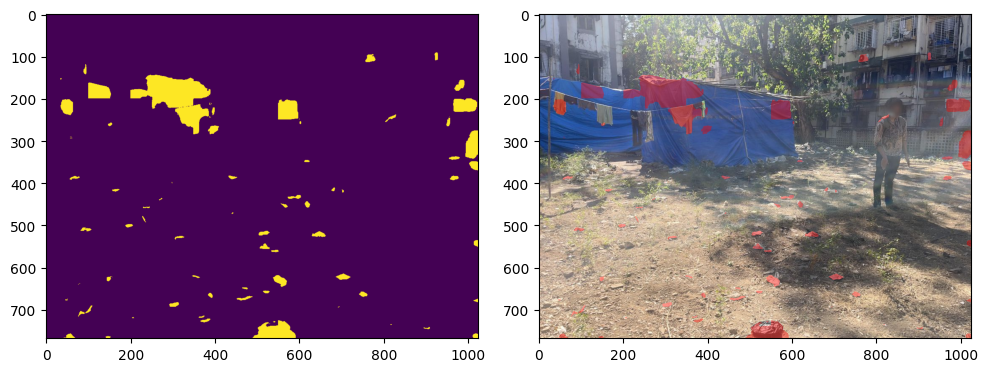

In [20]:
show([mask, overlaid])

In [ ]:
DS / "samples_mapillary"

Path('../../datasets')

In [16]:
INITIAL_RESULTS_DIR = mkdir(NEG_MASK_WORK_DIR / "samples_mapillary" / "100")
images = list((DS / "samples_mapillary").rglob("*.jpg"))

# len(images)
run_model_on_images(images, learner100, SIZE, INITIAL_RESULTS_DIR)

100%|██████████| 80/80 [00:00<00:00, 31832.30it/s]
/var/folders/sn/p2_4kq491_d66c474d1ms9jm0000gn/T/ipykernel_32864/1002989766.py:19: DeprecationWarning: 'mode' parameter for changing data types is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray(mask, "L").save(dest / "mask.png")
 58%|█████▊    | 1984/3400 [1:20:36<57:32,  2.44s/it]  


KeyboardInterrupt: 

In [32]:
# generate the masks first
learner50 = load_learner(
    "/Users/hariomnarang/Desktop/personal/roads/datasets/models/iter_4_engulf_t009_more-skew-resnet18-v2.pkl"
)
run_model_on_images(images, learner50, 50, mkdir(NEG_MASK_WORK_DIR / "50"))


/Users/hariomnarang/Desktop/personal/roads/mtrain/.venv/lib/python3.12/site-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")
100%|██████████| 252/252 [00:00<00:00, 107963.70it/s]
/var/folders/sn/p2_4kq491_d66c474d1ms9jm0000gn/T/ipykernel_61168/3746651495.py:15: DeprecationWarning: 'mode' parameter for changing data types is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray(mask, "L").save(dest / "mask.png")
100%|██████████| 80/80 [09:54<00:00,  7.43s/it]


# Generate after segmasks

This would be the test output right now

In [34]:
from mtrain.seg import mapillary as mapi, elevated_vegetation as elev
import json

SEGS = BASE / "test-pos-samples" / "segs"

def _get_cached_elev_pred(img_path):
    cand = SEGS / "elev" / f"{img_path.parent.name}.json"
    if cand.exists():
        with open(cand) as f:
            return np.array(json.load(f))
    return None


def _get_cached_mapillary_pred(img_path):
    cand = SEGS / "mapillary" / f"{img_path.parent.name}.json"
    if cand.exists():
        with open(cand) as f:
            return np.array(json.load(f))
    return None


def _get_elev_mask(img_path):
    pred = _get_cached_elev_pred(img_path)
    if pred is None:
        pred = elev.cached_predict(img_path)
    # just allow background (we dont want elevated_vegetation to be part of the output)
    neg_mask = elev.get_mask_with_labels(pred, [elev.Label.BACKGROUND])
    return neg_mask


def _get_mapillary_mask(img_path):
    pred = _get_cached_mapillary_pred(img_path)
    if pred is None:
        pred = mapi.cached_predict(img_path)
    neg_mask = mapi.get_mask_with_labels(
        pred,
        [
            mapi.Label.ROAD,
            mapi.Label.VEGETATION,
            mapi.Label.BIKE_LANE,
            mapi.Label.SIDEWALK,
            mapi.Label.SAND,
            mapi.Label.TERRAIN,
            mapi.Label.CURB,
            mapi.Label.CURB_CUT,
        ],
    )
    return neg_mask

In [40]:
def save_filter_masks(base_dir: Path):
    for img in tqdm(list(base_dir.rglob("image.jpg"))):
        filter_mask = _get_mapillary_mask(img) & _get_elev_mask(img)
        mask = DiskMask.load_as_bool(img.parent / "mask.png")
        res_mask = mask & filter_mask

        DiskMask.save(res_mask, img.parent / "out_mask.png")
        DiskMask.save(filter_mask, img.parent / "seg_filter_mask.png")

In [41]:
save_filter_masks(NEG_MASK_WORK_DIR / "50")
save_filter_masks(NEG_MASK_WORK_DIR / "100")

  0%|          | 0/80 [00:00<?, ?it/s]/var/folders/sn/p2_4kq491_d66c474d1ms9jm0000gn/T/ipykernel_17234/3182480650.py:13: DeprecationWarning: 'mode' parameter for changing data types is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray(arr, "L").save(path)
100%|██████████| 80/80 [00:13<00:00,  6.06it/s]


# Test outputs

Just checking how stuff is looking. Although simple segmentation masks are not very reliable I feel, I might need to train the whole model without the masks. for now, im just using the segmask outputs as output labels for my dataset work. Initial model harness testing.  

figsize (20, 20)


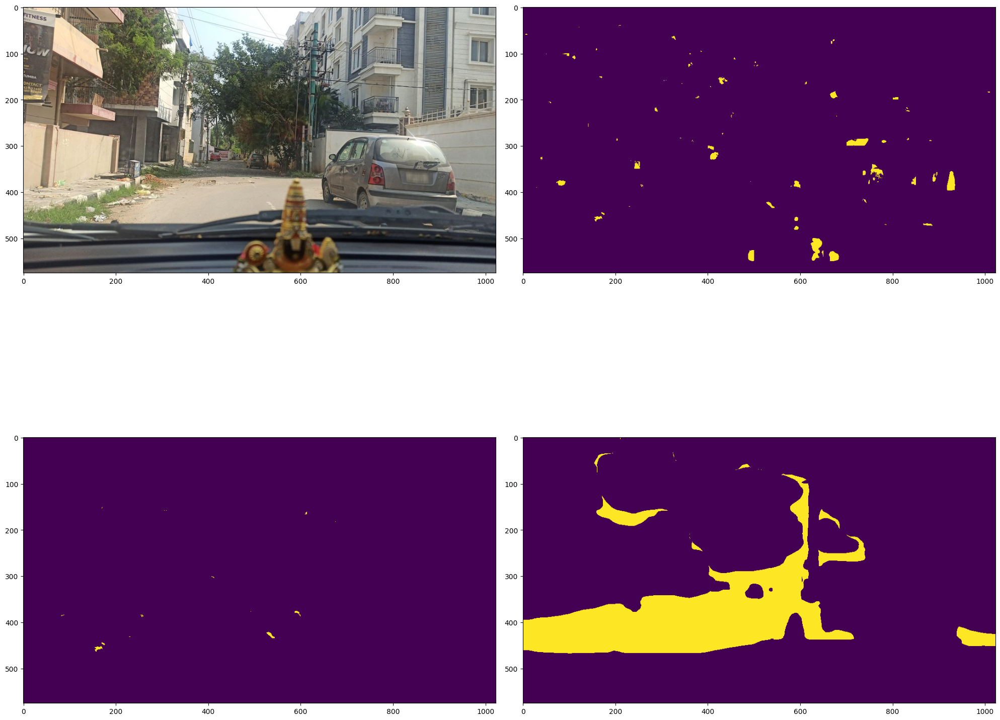

In [42]:
bd = NEG_MASK_WORK_DIR / "50" / "133855545702381"

img = DiskImage.load(bd / "image.jpg")
orig_mask = DiskMask.load_as_bool(bd / "mask.png")
out_mask = DiskMask.load_as_bool(bd / "out_mask.png")
seg_filter_mask = DiskMask.load_as_bool(bd / "seg_filter_mask.png")

show([img, orig_mask, out_mask, seg_filter_mask])

figsize (20, 20)


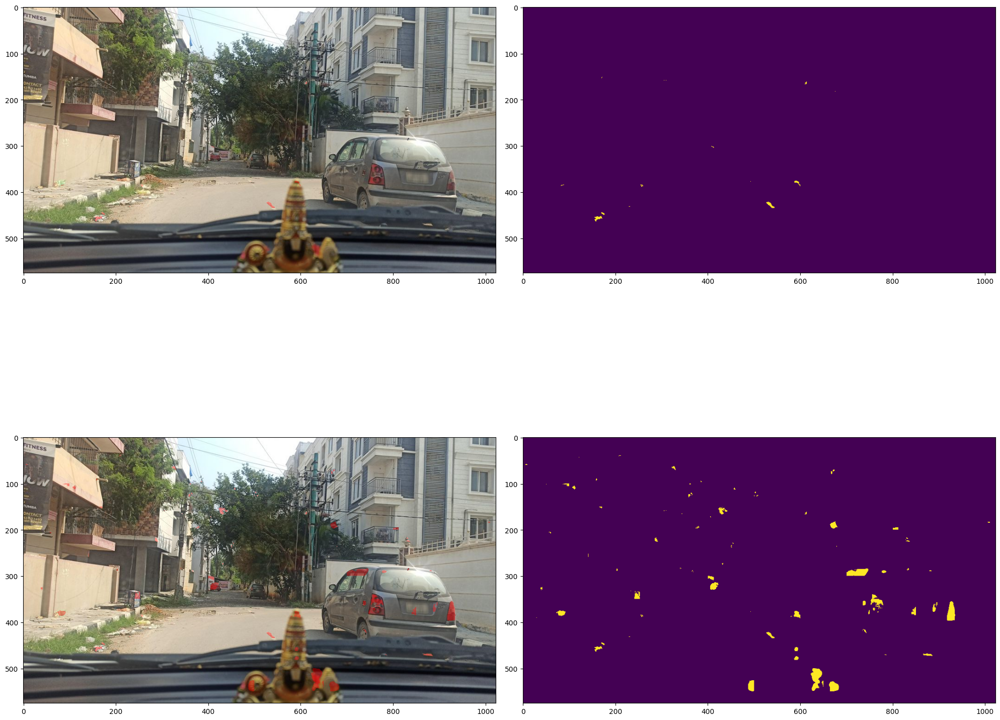

In [45]:
show([
    overlay_mask_on_img(img, out_mask),
    out_mask,
    overlay_mask_on_img(img, orig_mask),
    orig_mask,
])

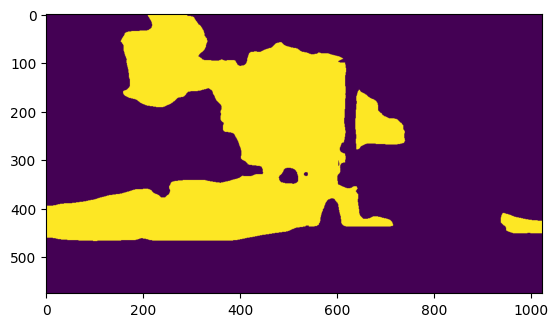

In [37]:
plt.imshow(_get_mapillary_mask(bd / "image.jpg"))

In [16]:
pred = _get_cached_mapillary_pred(bd / "image.jpg")

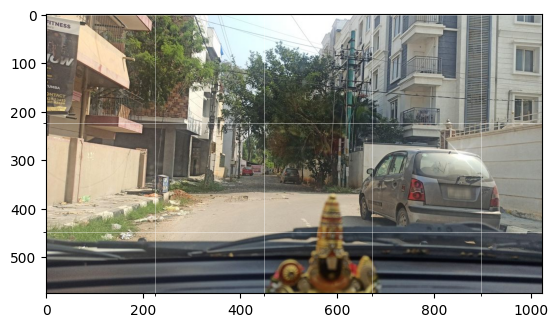

In [57]:
_, ax = plt.subplots(1,1)
ax.imshow(img)
draw_grid(ax, img.shape, 224)

In [33]:
np.unique(pred[400:425, 125:150])

array([ 2, 15, 29])

# Tiling
We have very bad resolution, we simply get tiles from the images instead of resizing. We dont want to resize at all.   
Btw, it makes sense to train on sizes of factor 32, apparently resnet is good with them. I will need to do that once in my models also.  

In [ ]:
def tile_image(img, N, stride):
    """
    img: numpy array (H, W, C)
    N: tile size
    stride: step size between tiles
    Returns list of (tile, (row_start, col_start)) tuples
    """
    H, W = img.shape[:2]
    tiles = []
    
    row_starts = list(range(0, H - N, stride)) + [H - N]
    col_starts = list(range(0, W - N, stride)) + [W - N]
    
    # deduplicate while preserving order
    row_starts = sorted(set(row_starts))
    col_starts = sorted(set(col_starts))
    
    for r in row_starts:
        for c in col_starts:
            tile = img[r:r+N, c:c+N]
            tiles.append(tile)
    
    return tiles

In [7]:
# test
bd = NEG_MASK_WORK_DIR / "50" / "133855545702381"

img = DiskImage.load(bd / "image.jpg")
orig_mask = DiskMask.load_as_bool(bd / "mask.png")
out_mask = DiskMask.load_as_bool(bd / "out_mask.png")
seg_filter_mask = DiskMask.load_as_bool(bd / "seg_filter_mask.png")


img_tiles = tile_image(img, 224, 112)
mask_tiles = tile_image(out_mask, 224, 112)



show(img_tiles)

figsize (230, 230)


In [8]:
show(mask_tiles)

figsize (230, 230)


# Tiled dataset

- The first thing we do is use the existing dataset
- Tile each image and mask -> gives up a good number of data points
- Keep 3x empty tiles compared to tiles with non zero mask

In [19]:
def get_filtered_tiles(in_d: Path, N: int, stride: int):
    img = DiskImage.load(in_d / "image.jpg")
    out_mask = DiskMask.load(in_d / "out_mask.png")
    mask = DiskMask.load(in_d / "mask.png")

    image_tiles = tile_image(img, N, stride)
    out_mask_tiles = tile_image(out_mask, N, stride)
    mask_tiles = tile_image(mask, N, stride)

    it = zip(image_tiles, mask_tiles, out_mask_tiles)
    pos_samples, empty_samples = [], []
    for imt, mt, omt in it:
        if omt.sum() + mt.sum() > 0:
            pos_samples.append((imt, mt, omt))
        else:
            empty_samples.append((imt, mt, omt))


    random.shuffle(pos_samples)
    random.shuffle(empty_samples)
    empty_samples = empty_samples[:3*len(pos_samples)]

    res = pos_samples + empty_samples
    random.shuffle(res)
    return res

figsize (10, 10)


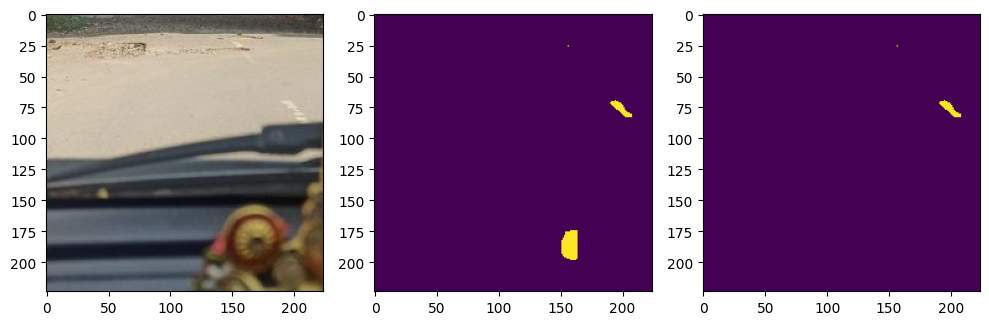

In [28]:
bd = NEG_MASK_WORK_DIR / "50" / "133855545702381"

tiles = get_filtered_tiles(bd, 224, 112)
show(tiles[0], ncols=3)

In [29]:
def make_tiled_dataset(orig_root: Path, dest: Path, N: int, stride: int):
    dest = mkdir(dest)
    ds = list(orig_root.glob("*"))
    for d in tqdm(ds):
        if not d.is_dir():
            continue
        tiles = get_filtered_tiles(d, N, stride)
        for i, tile in enumerate(tiles):
            dest_dir = mkdir(dest / f"{d.name}_{i}")
            image, mask, out_mask = tile
            DiskImage.save(image, dest_dir / "image.jpg")
            DiskMask.save(mask, dest_dir / "mask.png")
            DiskMask.save(out_mask, dest_dir / "out_mask.png")

In [31]:
tiled_dir = mkdir(NEG_MASKING_DIR / "tiled")
make_tiled_dataset(NEG_MASK_WORK_DIR / "100", tiled_dir, 224, 112)

100%|██████████| 80/80 [00:07<00:00, 10.16it/s]


## Testing

figsize (10, 10)


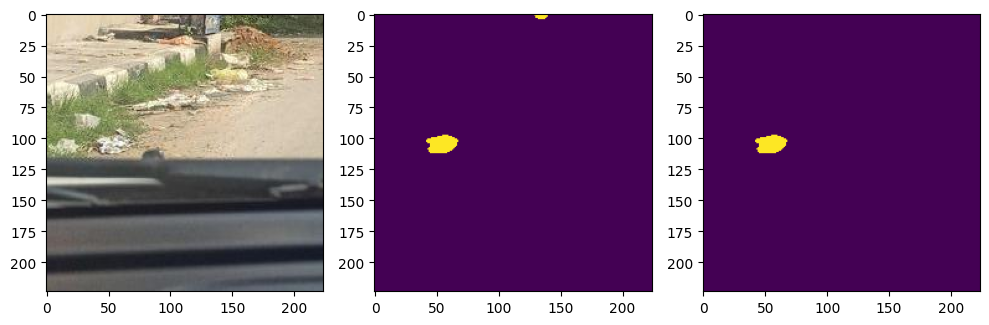

In [34]:
sample_dir = tiled_dir / "133855545702381_37"

img = DiskImage.load(sample_dir / "image.jpg")
mask = DiskMask.load_as_bool(sample_dir / "mask.png")
out_mask = DiskMask.load_as_bool(sample_dir / "out_mask.png")

show([img, mask, out_mask], ncols=3)

# Model harness: datasets and dataloaders

Following: https://docs.fast.ai/tutorial.siamese.html

In [36]:
ROOT_DATA_DIR = NEG_MASKING_DIR / "tiled"

In [75]:
def _is_valid_dir(direc: Path):
    valid = (direc / "image.jpg").exists() and (direc / "mask.png").exists() and (direc / "out_mask.png").exists()
    if not valid:
        print(f"WARN: directory: {direc} is not valid, it does not contain all required files")
    return valid

class MaskFixDataset(torch.utils.data.Dataset):
    def __init__(self, dirs: list[Path | str], norm_stats: tuple[list[float], list[float]]):
        self.mean = torch.tensor(norm_stats[0])
        self.std  = torch.tensor(norm_stats[1])
        self.dirs = [d for d in map(Path, dirs) if _is_valid_dir(d)]
    
    def __len__(self):
        return len(self.dirs)
    
    # def __getit
    def __getitem__(self, index):
        d = self.dirs[index]
        img = torch.Tensor(DiskImage.load(d / "image.jpg"))
        img = img.permute(2,0,1).float() / 255.0
        img = (img - self.mean[:,None,None]) / self.std[:,None,None]
        mask = torch.Tensor(DiskMask.load(d / "mask.png"))
        mask = mask.float().unsqueeze(0)
        combined = torch.cat([img, mask], dim=0)
        out_mask = torch.Tensor(DiskMask.load(d / "out_mask.png"))

        # flipping, not doing rn, not very necessary for now
        # if random.random() > 0.5:
        #     combined = torch.flip(combined, dims=[-1])
        #     out_mask = torch.flip(out_mask, dims=[-1])

        return (combined, out_mask)

In [76]:
from fastai.vision.all import imagenet_stats

dirs = list(ROOT_DATA_DIR.glob("*"))
idxs = np.random.permutation(range(len(dirs)))
cut = int(0.8 * len(dirs))

train_dirs = [dirs[idx] for idx in idxs[:cut]]
valid_dirs = [dirs[idx] for idx in idxs[cut:]]

train_ds = MaskFixDataset(train_dirs, imagenet_stats)
valid_ds = MaskFixDataset(valid_dirs, imagenet_stats)

In [77]:
from fastai.data.core import DataLoaders

dls = DataLoaders.from_dsets(train_ds, valid_ds)

In [ ]:
from fastai.vision.all import unet_learner, resnet18, BCEWithLogitsLossFlat, ProgressCallback, store_attr, DiceLoss

class CombinedLoss:
    def __init__(self, axis=1, smooth=1., alpha=1.):
        store_attr()
        self.bce_loss = BCEWithLogitsLossFlat(axis=axis)
        self.dice_loss = DiceLoss(axis, smooth)
        
    def __call__(self, pred, targ):
        return self.bce_loss(pred, targ) + self.alpha * self.dice_loss(pred, targ)
    
    def decodes(self, x):     return (x.sigmoid() > 0.5).long()
    def activation(self, x):  return x.sigmoid()

learn = unet_learner(
    dls,
    resnet18,
    n_in=4,
    n_out=1,
    normalize=False,
    pretrained=True,
    loss_func=BCEWithLogitsLossFlat(),
)
learn.remove_cb(ProgressCallback)

In [83]:
learn.fine_tune(1)

KeyboardInterrupt: 

In [78]:
b = dls.one_batch()

In [79]:
b[0].shape

torch.Size([64, 4, 224, 224])